# Inpainting

## Set Up

In [9]:
from diffusers import UNet2DModel, DDPMScheduler, DDIMScheduler
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import torch
from IPython.display import clear_output

model_id = "google/ddpm-celebahq-256"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# load model and scheduler
unet = UNet2DModel.from_pretrained(model_id).to(device)

c:\Users\Usuario\anaconda3\envs\synthetic\Lib\site-packages\huggingface_hub\utils\_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


## Simple Denoising

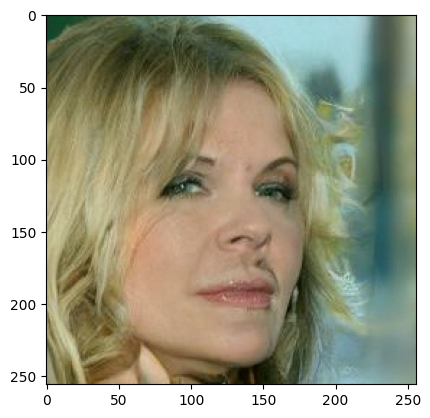

In [2]:
torch.manual_seed(1)

unet = unet.to(device)
xt = torch.randn(1, 3, 256, 256).to(device)

scheduler = DDIMScheduler(beta_start=0.0001, beta_end=0.02, beta_schedule="linear", num_train_timesteps=1000)
scheduler.set_timesteps(50)

# sample from the model
unet.eval()

# Denoising Loop
for t in tqdm(scheduler.timesteps, total=scheduler.num_inference_steps, leave=False):
    with torch.no_grad():
        # Pred the noise
        noise_pred = unet(xt, t.to(device)).sample
    
    # To denoise
    xt = scheduler.step(noise_pred, t.to(device), xt).prev_sample

plt.imshow(xt.squeeze().permute(1, 2, 0).cpu().numpy()*0.5 + 0.5)
plt.show()

## Load the Image

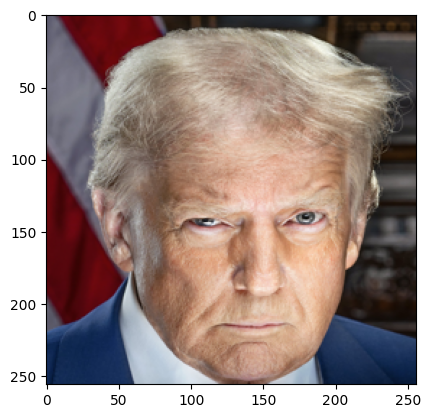

In [3]:
from PIL import Image
import numpy as np
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

ref_image = Image.open("data/dt.png").crop((300, 200, 2200, 2300)).resize((256, 256)).convert("RGB")
ref_image = transform(ref_image).unsqueeze(0).to(device)

plt.imshow(ref_image.squeeze().permute(1, 2, 0).cpu().numpy()*0.5 + 0.5)
plt.show()

## Create a Mask

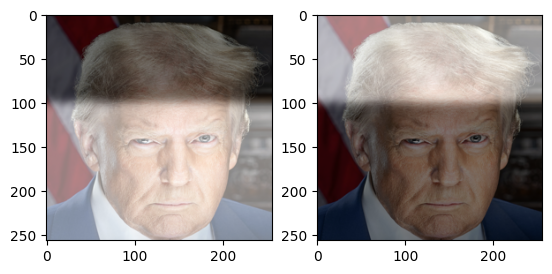

In [16]:
import numpy as np
from scipy.ndimage import gaussian_filter

mask = np.ones((256, 256), dtype=np.float32)
mask[0:100, :] = 0.0

# Apply Gaussian smoothing
mask = gaussian_filter(mask, sigma=5)

# Convert to torch tensor
mask = torch.from_numpy(mask).to(device)

# Compute inverse mask
inv_mask = 1.0 - mask

# Plot the mask and inv mask
plt.subplot(1, 2, 1)
plt.imshow(ref_image.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
plt.imshow(mask.squeeze().cpu().numpy(), cmap="grey", alpha=0.5)

plt.subplot(1, 2, 2)
plt.imshow(ref_image.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
plt.imshow(inv_mask.squeeze().cpu().numpy(), cmap="grey", alpha=0.5)

## Repaint

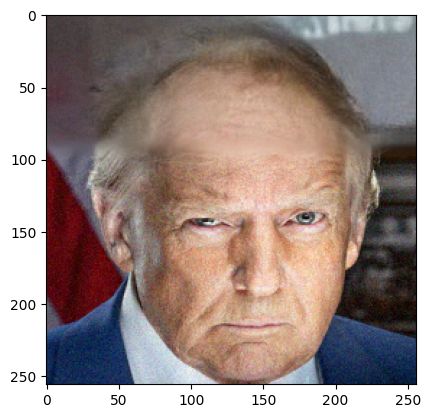

In [17]:
xt = torch.randn(1, 3, 256, 256).to(device)
torch.manual_seed(1)

# Denoising Loop
for t in tqdm(scheduler.timesteps, total=scheduler.num_inference_steps, leave=False):

    with torch.no_grad():
        noise_pred = unet(xt, t.to(device)).sample
    xt = scheduler.step(noise_pred, t.to(device), xt).prev_sample

    # add noise to the ref image
    noise = torch.randn_like(ref_image).to(device)
    x_noised = scheduler.add_noise(ref_image, noise, t.to(device))

    xt = xt * inv_mask[None, None, :, :] + x_noised * mask[None, None, :, :]

    if t%50:
        plt.imshow(xt.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
        clear_output(wait=True)
        plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0016312599..0.986194].


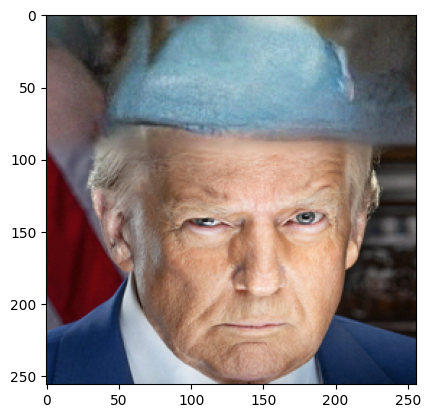

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0038914084..0.9840871].


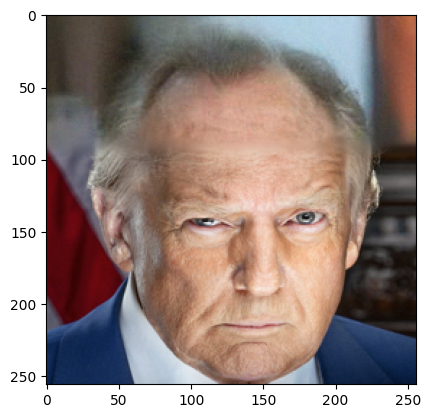

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0003864169..0.9905748].


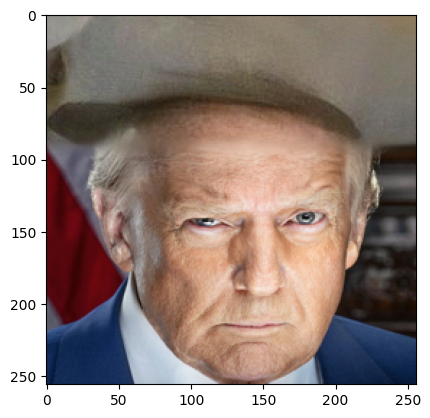

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.003192842..0.9868674].


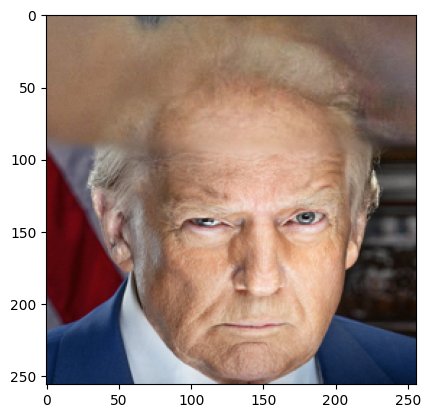

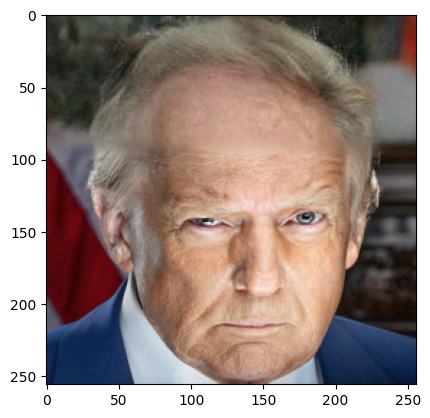

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.003877759..0.9895151].


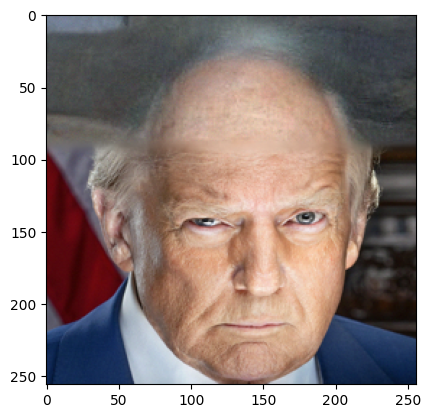

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0029208064..0.9873011].


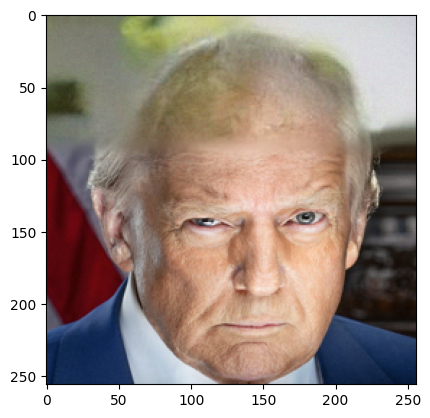

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0021945238..0.99033713].


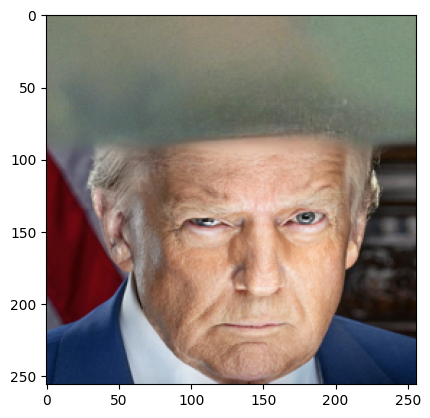

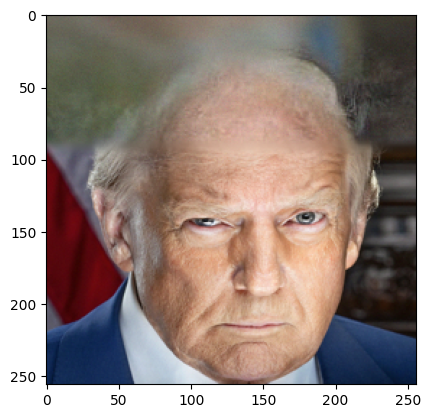

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0031033158..0.9915618].


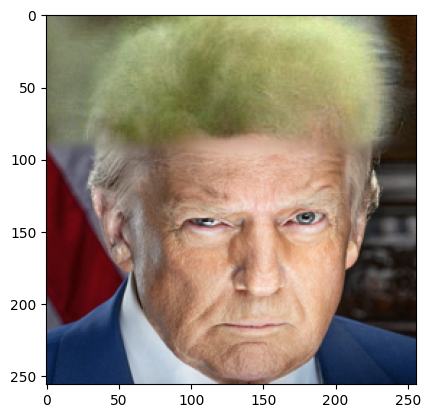

In [18]:
for seed in range(10):
    torch.manual_seed(seed=seed)

    # sample random noise
    xt = torch.randn(1, 3, 256, 256).to(device)

    # Denoising Loop
    for t in tqdm(scheduler.timesteps, total=scheduler.num_inference_steps, leave=False):

        with torch.no_grad():
            noise_pred = unet(xt, t.to(device)).sample
        xt = scheduler.step(noise_pred, t.to(device), xt).prev_sample

        # add noise to the ref image
        noise = torch.randn_like(ref_image).to(device)
        x_noised = scheduler.add_noise(ref_image, noise, t.to(device))

        xt = xt*inv_mask[None, None, :, :] + x_noised*mask[None, None, :, :]

    plt.imshow(xt.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
    plt.show()

# Image-to-Image Diffusion

## Set Up

In [1]:
from diffusers import UNet2DModel, DDIMScheduler
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import torch

model_id = "google/ddpm-celebahq-256"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

unet = UNet2DModel.from_pretrained(model_id)

unet.eval()
unet.to(device)

c:\Users\Usuario\anaconda3\envs\synthetic\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Usuario\anaconda3\envs\synthetic\Lib\site-packages\huggingface_hub\utils\_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Con

## Load the Image

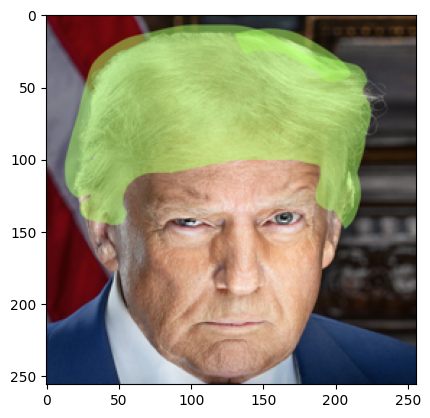

In [2]:
from PIL import Image
import numpy as np
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

ref_image = Image.open("data/dt_hair.png").resize((256, 256)).convert("RGB")
ref_image = transform(ref_image).unsqueeze(0).to(device)

plt.imshow(ref_image.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
plt.show()

## Image-to-image Diffusion

c:\Users\Usuario\anaconda3\envs\synthetic\Lib\site-packages\huggingface_hub\utils\_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
c:\Users\Usuario\anaconda3\envs\synthetic\Lib\site-packages\huggingface_hub\file_download.py:121: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Usuario\.cache\huggingface\hub\models--google--ddpm-celebahq-256. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an admini

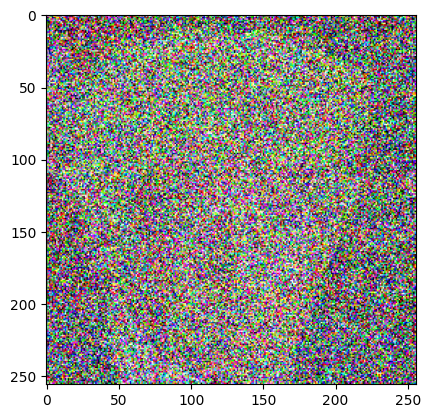

In [3]:
scheduler = DDIMScheduler.from_pretrained(model_id)
scheduler.set_timesteps(50)

denoising_t = 500

torch.manual_seed(0)
t = torch.tensor([denoising_t]).long().to(device)

noise = torch.randn_like(ref_image).to(device)
x_noised = scheduler.add_noise(ref_image, noise, t)
x_noised = x_noised.to(device)

plt.imshow(x_noised.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
plt.show()

In [4]:
scheduler.timesteps

tensor([980, 960, 940, 920, 900, 880, 860, 840, 820, 800, 780, 760, 740, 720,
        700, 680, 660, 640, 620, 600, 580, 560, 540, 520, 500, 480, 460, 440,
        420, 400, 380, 360, 340, 320, 300, 280, 260, 240, 220, 200, 180, 160,
        140, 120, 100,  80,  60,  40,  20,   0])

  0%|          | 0/50 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5535562..2.6626158].


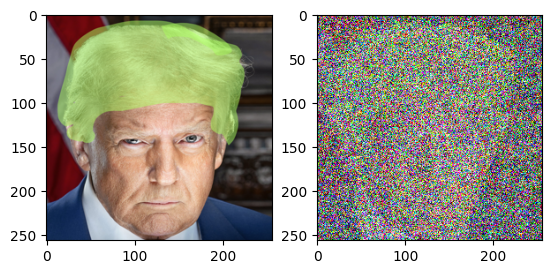

 50%|█████     | 25/50 [00:00<00:00, 43.79it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5422845..2.6492226].


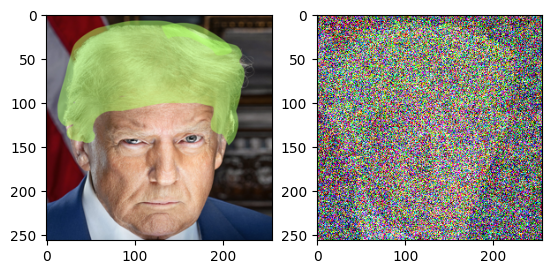

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5279717..2.6326468].


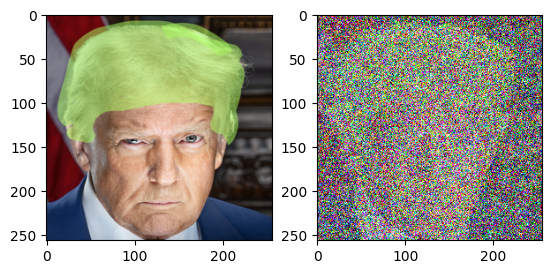

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5102084..2.6125517].


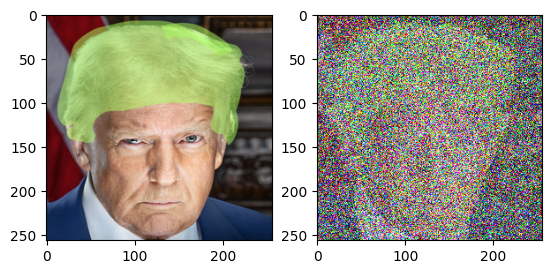

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4887314..2.588492].


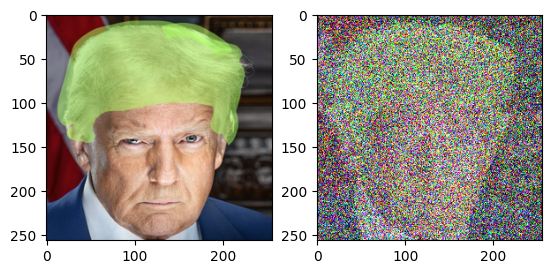

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4629658..2.5598707].


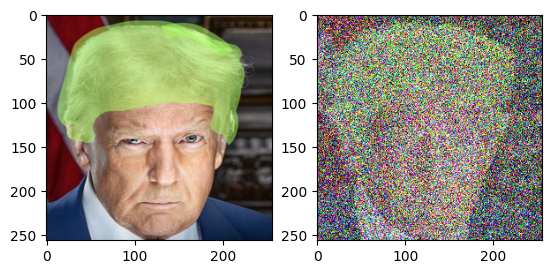

 60%|██████    | 30/50 [00:01<00:01, 17.43it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4325706..2.526282].


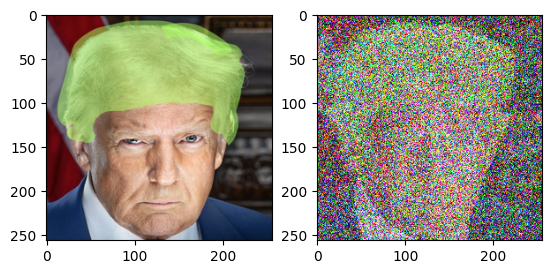

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3971314..2.487154].


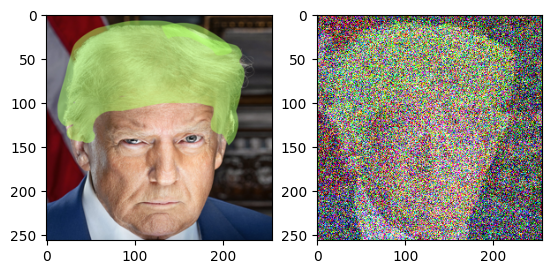

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3563839..2.442196].


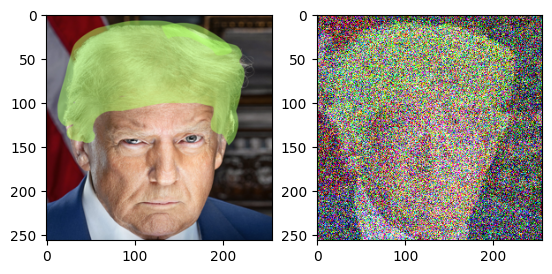

 66%|██████▌   | 33/50 [00:02<00:01, 12.33it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3099692..2.3911073].


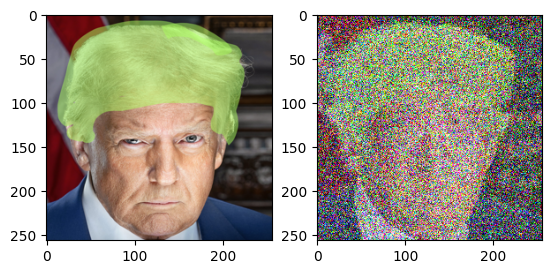

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2575593..2.3334472].


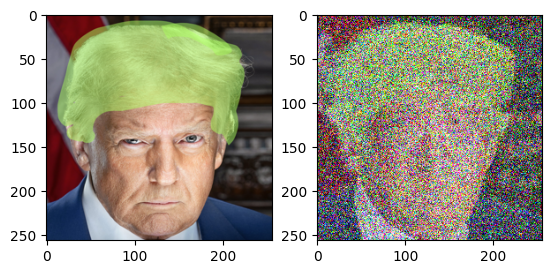

 70%|███████   | 35/50 [00:02<00:01, 10.36it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2016313..2.2690396].


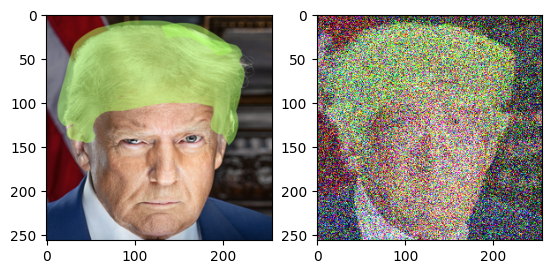

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1450732..2.1978323].


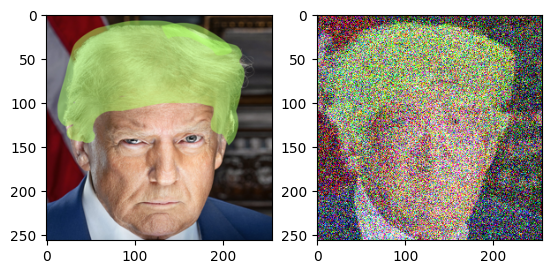

 74%|███████▍  | 37/50 [00:02<00:01,  8.63it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0821841..2.1197052].


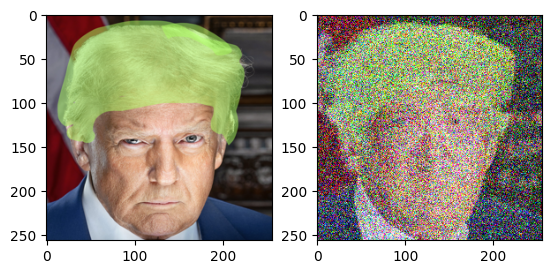

 76%|███████▌  | 38/50 [00:03<00:01,  8.11it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0127475..2.0345607].


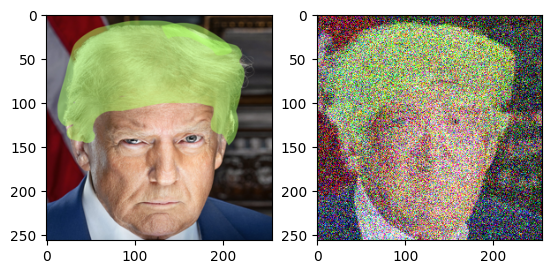

 78%|███████▊  | 39/50 [00:03<00:01,  7.61it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.937073..1.942697].


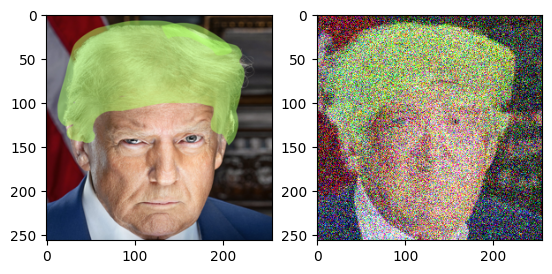

 80%|████████  | 40/50 [00:03<00:01,  6.98it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.85505104..1.8440658].


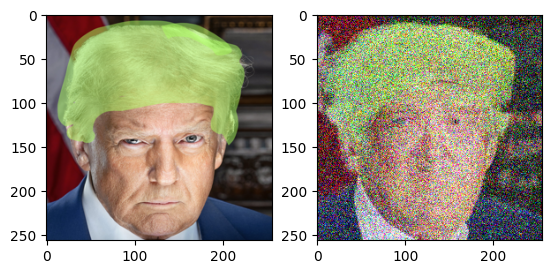

 82%|████████▏ | 41/50 [00:03<00:01,  6.64it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7669531..1.7391135].


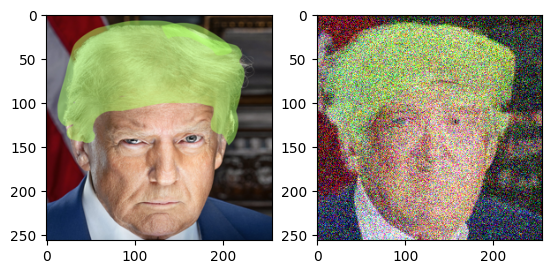

 84%|████████▍ | 42/50 [00:03<00:01,  6.39it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.673035..1.6282].


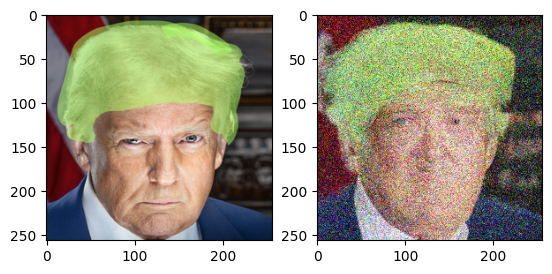

 86%|████████▌ | 43/50 [00:04<00:01,  6.07it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5735456..1.5116913].


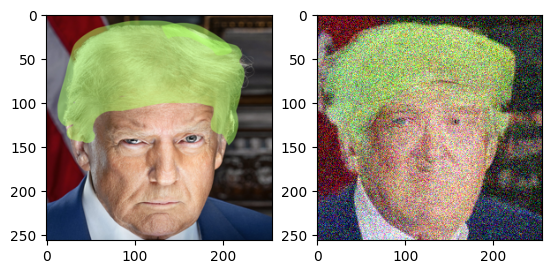

 88%|████████▊ | 44/50 [00:04<00:01,  5.86it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46918857..1.390578].


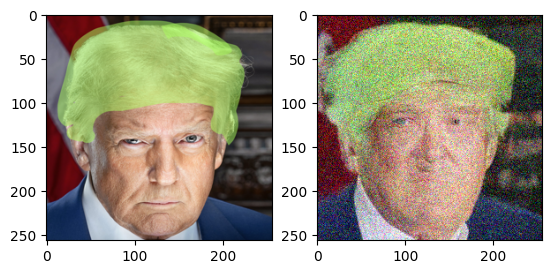

 90%|█████████ | 45/50 [00:04<00:00,  5.75it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3600874..1.2671604].


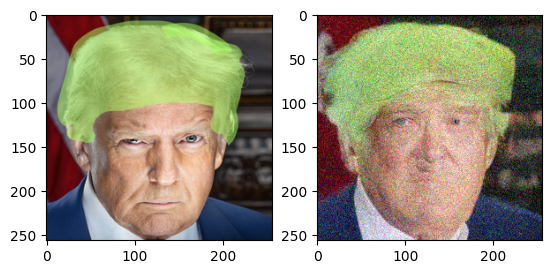

 92%|█████████▏| 46/50 [00:04<00:00,  5.69it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24673367..1.1631383].


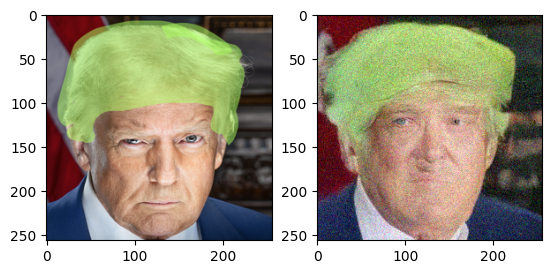

 94%|█████████▍| 47/50 [00:04<00:00,  5.62it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12916595..1.0566462].


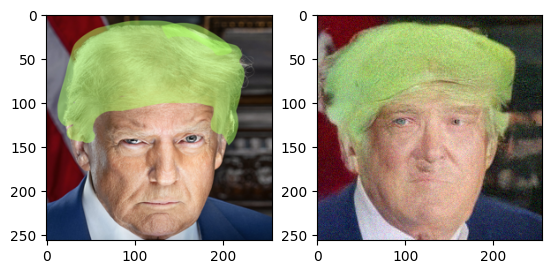

 96%|█████████▌| 48/50 [00:05<00:00,  4.19it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011835575..0.9634218].


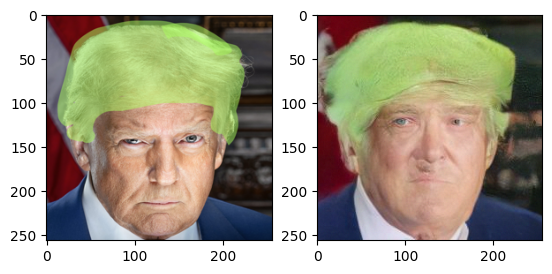

 98%|█████████▊| 49/50 [00:05<00:00,  4.49it/s]

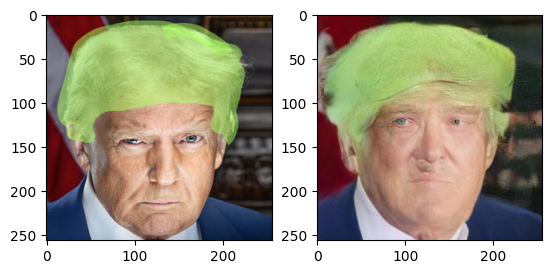

In [5]:
from IPython.display import clear_output

x_t = x_noised

# Denoising Loop
for t in tqdm(scheduler.timesteps, total=scheduler.num_inference_steps, leave=False):

    if t > denoising_t:
        continue

    with torch.no_grad():
        noise_pred = unet(x_t, t.to(device)).sample
    
    x_t = scheduler.step(noise_pred, t.to(device), x_t).prev_sample

    plt.subplot(1, 2, 1)
    plt.imshow(ref_image.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
    plt.subplot(1, 2, 2)
    plt.imshow(x_t.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
    plt.show()

## Making various Combination of denoising strength

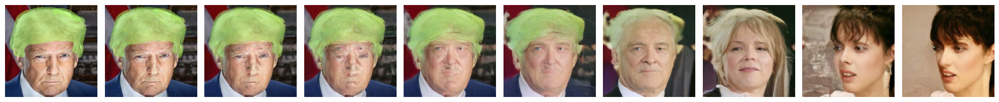

In [6]:
scheduler = DDIMScheduler(beta_start=0.0001, beta_end=0.02, beta_schedule="linear", num_train_timesteps=1000)
scheduler.set_timesteps(50)

_, axes = plt.subplots(1, 10, figsize=(20, 5))

timesteps = torch.linspace(0, 999, 10).long().to(device)
for i, denoising_t in enumerate(timesteps):

    torch.manual_seed(0)
    t = torch.tensor([denoising_t]).long().to(device)

    noise = torch.randn_like(ref_image).to(device)
    x_noised = scheduler.add_noise(ref_image, noise, t)
    x_noised = x_noised.to(device)

    x_t = x_noised
    # Denoising Loop
    for t in tqdm(scheduler.timesteps, total=scheduler.num_inference_steps, leave=False):

        if t > denoising_t:
            continue

        with torch.no_grad():
            noise_pred = unet(x_t, t.to(device)).sample
        
        x_t = scheduler.step(noise_pred, t.to(device), x_t).prev_sample
    
    axes[i].imshow(x_t.squeeze().permute(1, 2, 0).cpu().numpy()*0.5+0.5)
    axes[i].axis("off")

plt.tight_layout()
plt.show()
